# Sanity check for trained model 
This is a mirror of 1.21 except that it evaluates a model trained with a single output class instead of two output classes. Previous models trained with 'absent' and 'present' encoded as different classes.

In [1]:
# imports
from pathlib import Path
import pandas as pd
import sys
BASE_PATH = Path.cwd().parent.parent
sys.path.append(str(BASE_PATH))
from src.utils import show_sample_from_df
import pandas as pd
import opensoundscape as opso
from opensoundscape import Audio, Spectrogram
import numpy as np


/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:18: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [4]:
# Load the validation set
valid_set_path = BASE_PATH / 'data' / 'interim' / 'valid_set' 
valid_set = pd.read_pickle(valid_set_path / 'valid_df_verified.pkl')
valid_set = valid_set.drop(columns=["target_absence"])
valid_set.sample(5)

,,,target_presence,confidence_cat
file,start_time,end_time,,
../../data/raw/recordings/OSFL/recording-556139.flac,19.5,22.5,0.0,0
../../data/raw/recordings/OSFL/recording-163485.mp3,13.5,16.5,0.0,0
../../data/raw/recordings/OSFL/recording-554020.flac,4.5,7.5,0.0,0
../../data/raw/recordings/OSFL/recording-553178.flac,34.5,37.5,0.0,0
../../data/raw/recordings/OSFL/recording-4504.flac,21.0,24.0,0.0,0


In [5]:
# Take a sample of 10 from each class
present_samples = valid_set.loc[valid_set['target_presence']==1].sample(10)
absent_samples = valid_set.loc[valid_set['target_presence']==0].sample(10)
present_samples.index[0]

(PosixPath('../../data/raw/recordings/OSFL/recording-555687.flac'), 36.0, 39.0)

In [6]:
# Load a trained model. 
model = opso.cnn.load_model(BASE_PATH / 'models' / 'osfl_model_single_neuron2024-03-07')
model.valid_metrics

{0: {'target_presence': {'au_roc': 0.637124,
   'avg_precision': 0.6542009838801834,
   'precision': 0.6127946127946128,
   'recall': 0.364,
   'f1': 0.4567126725219573,
   'support': 500},
  'precision': 0.5802237644342907,
  'recall': 0.567,
  'f1': 0.5483895864687924,
  'jaccard': 0.38329755302443,
  'hamming_loss': 0.433,
  'map': 0.6542009838801834,
  'au_roc': 0.637124},
 1: {'target_presence': {'au_roc': 0.8539680000000001,
   'avg_precision': 0.8835930434885025,
   'precision': 0.7306501547987616,
   'recall': 0.944,
   'f1': 0.8237347294938918,
   'support': 500},
  'precision': 0.8257770548005108,
  'recall': 0.798,
  'f1': 0.7936003858242293,
  'jaccard': 0.6588604891646435,
  'hamming_loss': 0.202,
  'map': 0.8835930434885025,
  'au_roc': 0.8539680000000001},
 2: {'target_presence': {'au_roc': 0.8949040000000001,
   'avg_precision': 0.911936395763816,
   'precision': 0.8551401869158879,
   'recall': 0.732,
   'f1': 0.7887931034482759,
   'support': 500},
  'precision': 0.81

In [11]:
valid_set_preds = model.predict(valid_set, batch_size=32, activation_layer='sigmoid')

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:201: UserWarning: The columns of input samples df differ from `model.classes`.
  warnings.warn(


  0%|          | 0/344 [00:00<?, ?it/s]

In [13]:
valid_set.columns, valid_set_preds.columns

(Index(['target_presence', 'confidence_cat'], dtype='object'),
 Index(['target_presence'], dtype='object'))

# Sigmoid or Softmax activation?
Choose Sigmoid, because Softmax doesn't make sense for the binary case. Sigmoid will also create a smoother probability distribution than softmax due to the lack of the exponent in the formula. 

In [43]:
# Example sigmoid outputs
present_preds = model.predict(present_samples, activation_layer='sigmoid')
absent_preds = model.predict(absent_samples, activation_layer='sigmoid')
present_preds.rename(columns={"target_presence": "present_pred"}, inplace=True)
absent_preds.rename(columns={"target_presence": "present_pred"}, inplace=True)


/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:201: UserWarning: The columns of input samples df differ from `model.classes`.
  warnings.warn(


  0%|          | 0/10 [00:00<?, ?it/s]

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:201: UserWarning: The columns of input samples df differ from `model.classes`.
  warnings.warn(


  0%|          | 0/10 [00:00<?, ?it/s]

In [44]:

# combine labels and predictions for samples of present and absent classes
present_labels_and_preds = pd.concat([present_samples, present_preds], axis=1)
absent_labels_and_preds = pd.concat([absent_samples, absent_preds], axis=1)
combined = pd.concat([present_labels_and_preds, absent_labels_and_preds], axis=0)

In [48]:
def show_example(counter):
    path, offset, end_time = combined.index[counter]
    duration = end_time - offset
    audio = Audio.from_file(path, offset=offset, duration=duration)
    spectrogram = Spectrogram.from_audio(audio)
    print(path, offset, end_time)
    print(audio.metadata)
    print(f"Confidence {combined.iloc[counter].confidence_cat}")
    print(f"Present Prediction = {combined.iloc[counter].present_pred} \nActual = {combined.iloc[counter].target_presence}")
    print("Check below")
    audio.show_widget()
    spectrogram.plot()
    counter += 1
    return counter


# Show Predictions
See example labels, predictions, audio and spectrograms below

In [55]:
next_example_idx = 0

../../data/raw/recordings/OSFL/recording-555687.flac 36.0 39.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 2646000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 1.0
Present Prediction = 0.052299391478300095 
Actual = 1.0
Check below


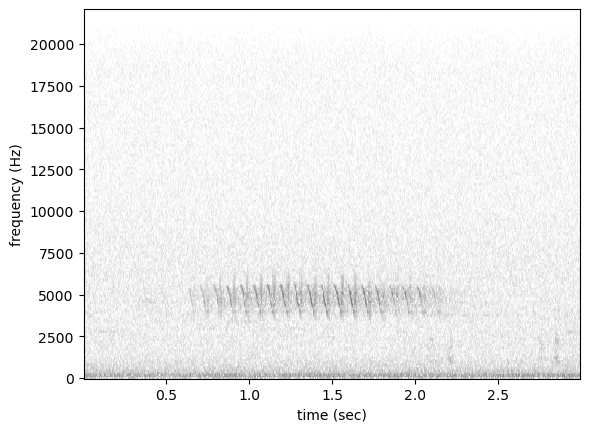

In [56]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-553458.flac 30.0 33.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 1.0
Present Prediction = 0.05503276735544205 
Actual = 1.0
Check below


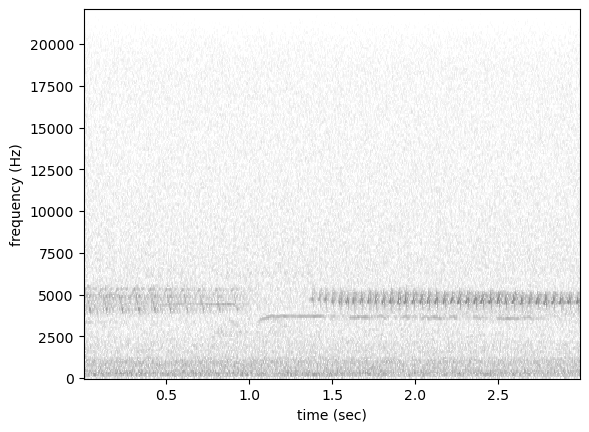

In [57]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-100632.flac 46.5 49.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7937792, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 1.0
Present Prediction = 0.0338829904794693 
Actual = 1.0
Check below


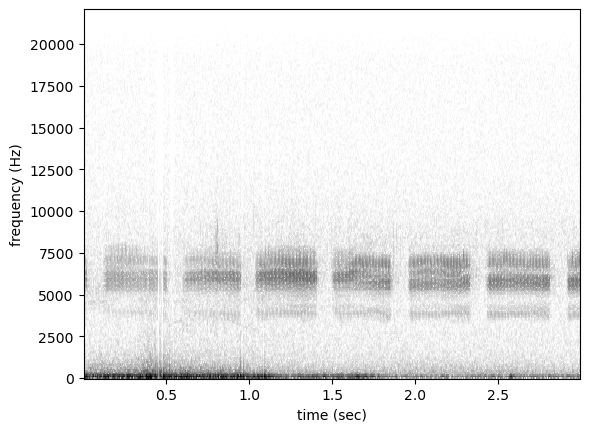

In [58]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-315883.mp3 3.0 6.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 1.0
Present Prediction = 0.34475457668304443 
Actual = 1.0
Check below


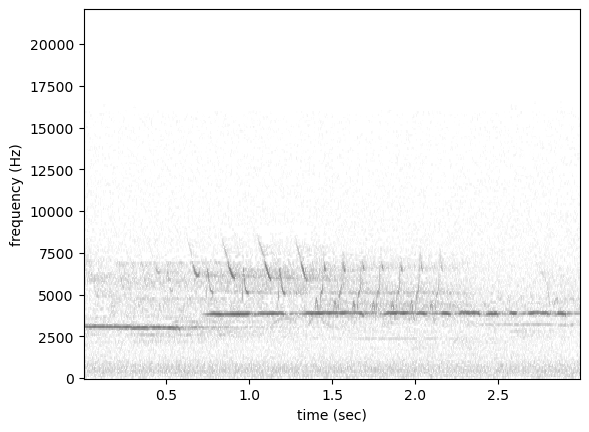

In [59]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-541681.flac 70.5 73.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 2.0
Present Prediction = 0.943977952003479 
Actual = 1.0
Check below


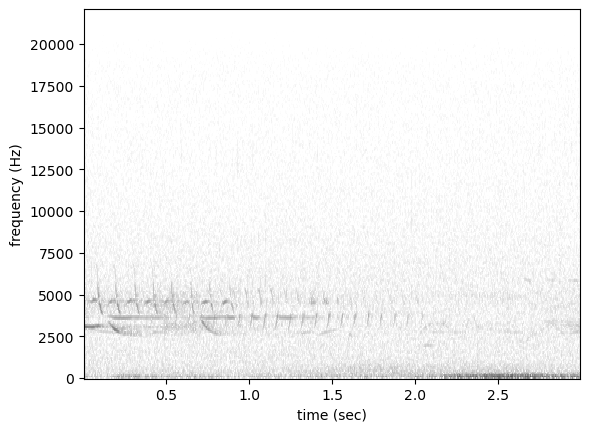

In [60]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-248827.mp3 25.5 28.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 1.0
Present Prediction = 0.04349260777235031 
Actual = 1.0
Check below


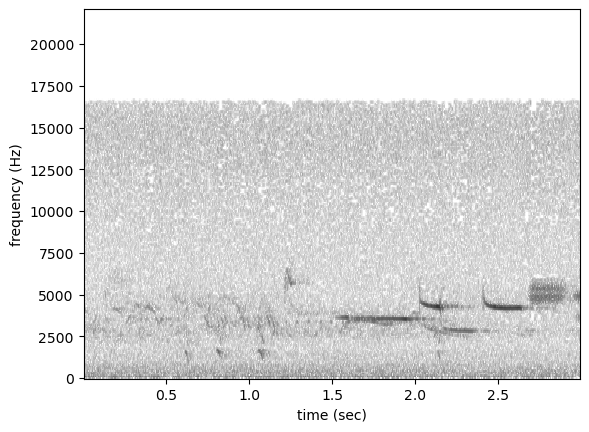

In [61]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-295022.mp3 6.0 9.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 2653384, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 3.0
Present Prediction = 0.9999440908432007 
Actual = 1.0
Check below


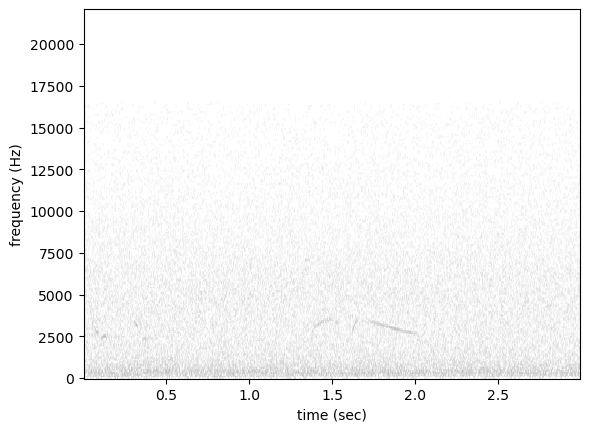

In [62]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-295435.mp3 4.5 7.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 2653384, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 3.0
Present Prediction = 0.9998428821563721 
Actual = 1.0
Check below


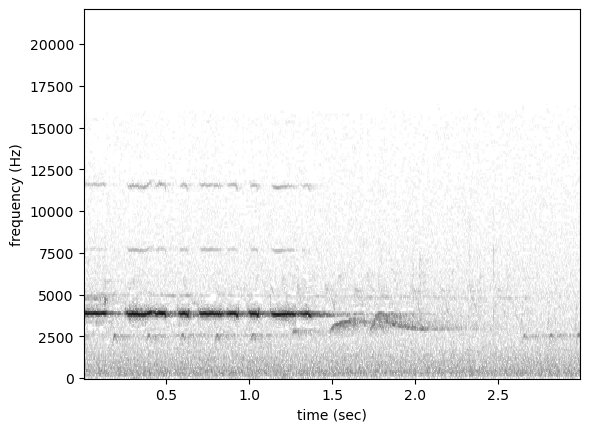

In [63]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-292179.mp3 16.5 19.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 13259997, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 2.0
Present Prediction = 0.9658539891242981 
Actual = 1.0
Check below


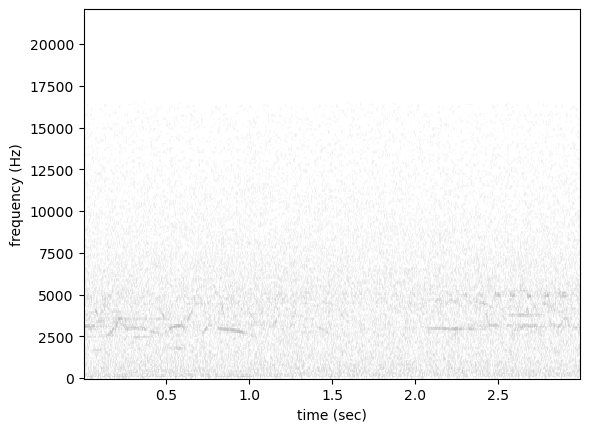

In [64]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-292038.mp3 240.0 243.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 13259997, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 1.0
Present Prediction = 0.6979053020477295 
Actual = 1.0
Check below


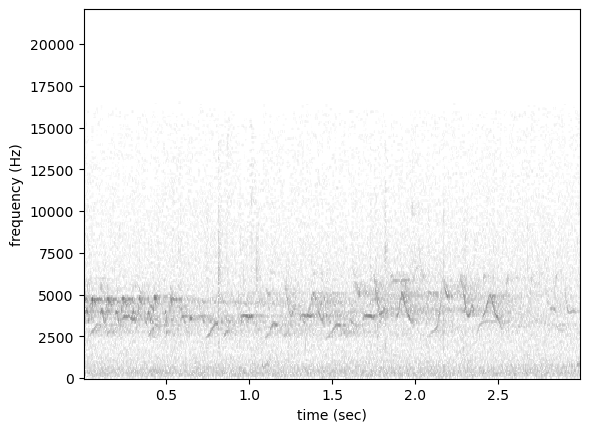

In [65]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-292766.mp3 75.0 78.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.09134754538536072 
Actual = 0.0
Check below


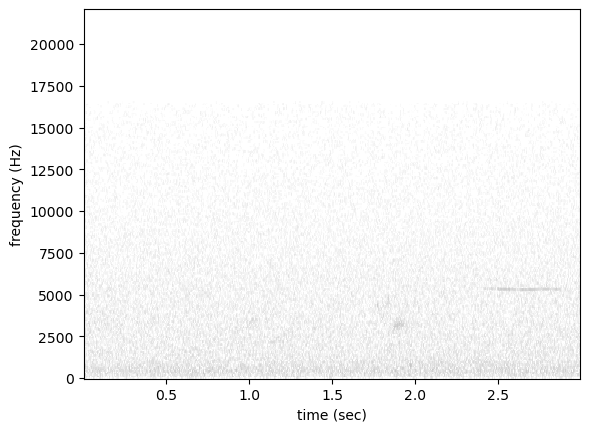

In [66]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-566654.flac 40.5 43.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938048, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.058289527893066406 
Actual = 0.0
Check below


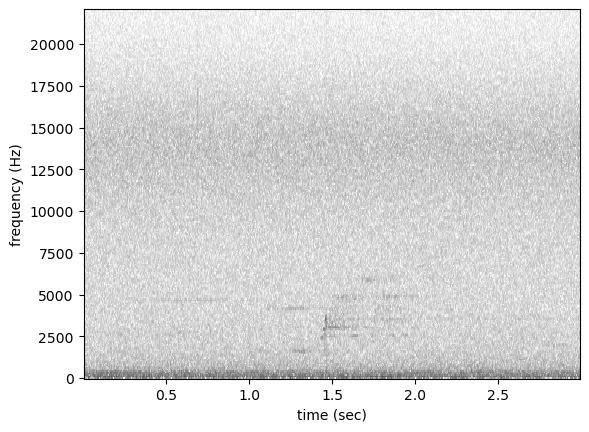

In [67]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-552524.flac 133.5 136.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 13225973, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.09451036155223846 
Actual = 0.0
Check below


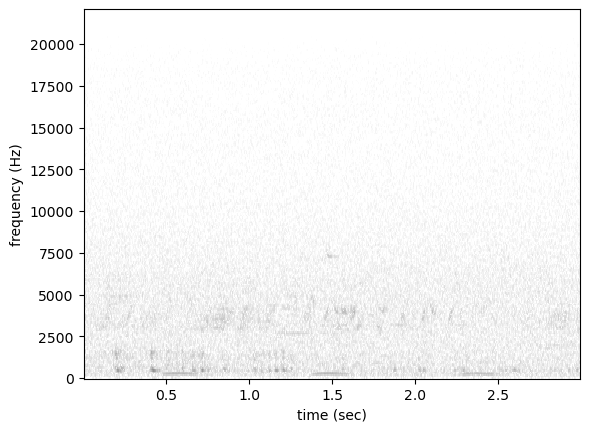

In [68]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-552910.flac 0.0 3.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 13225973, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.021050628274679184 
Actual = 0.0
Check below


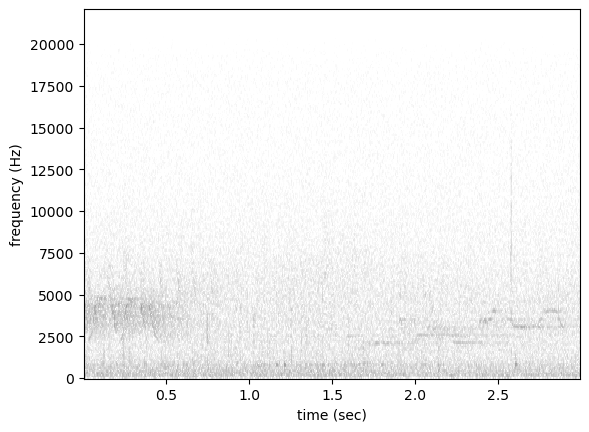

In [69]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-292038.mp3 159.0 162.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 13259997, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.004590792581439018 
Actual = 0.0
Check below


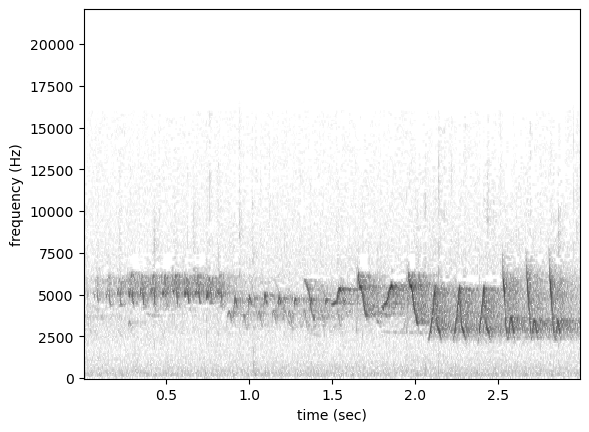

In [70]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-553324.flac 54.0 57.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.06569354981184006 
Actual = 0.0
Check below


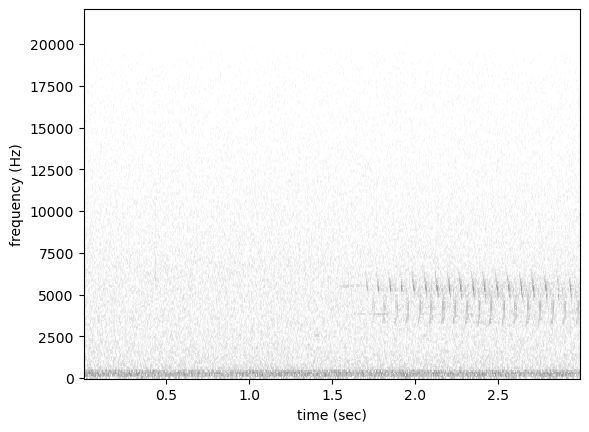

In [71]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-556096.flac 25.5 28.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 2646000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.0843692496418953 
Actual = 0.0
Check below


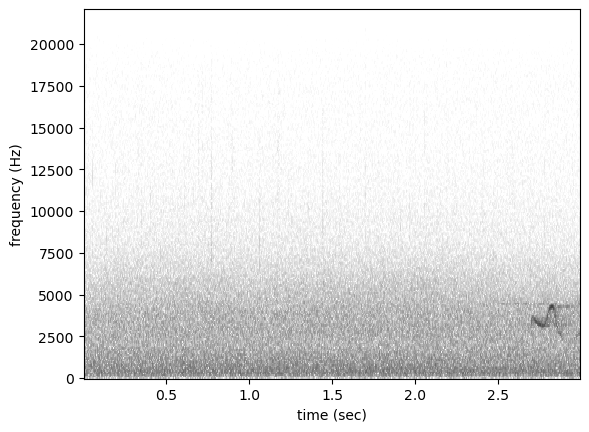

In [72]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-293057.mp3 60.0 63.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.03876486420631409 
Actual = 0.0
Check below


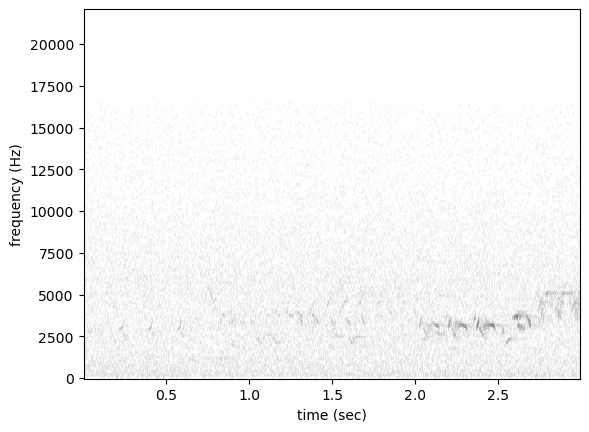

In [73]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-538575.flac 25.5 28.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 2646000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.0402202308177948 
Actual = 0.0
Check below


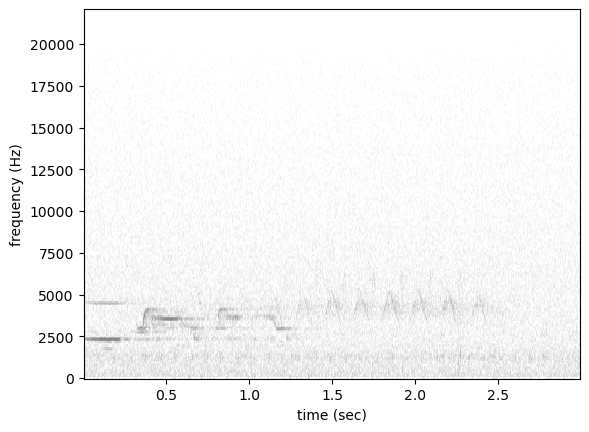

In [74]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-168840.flac 30.0 33.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7937792, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.021441902965307236 
Actual = 0.0
Check below


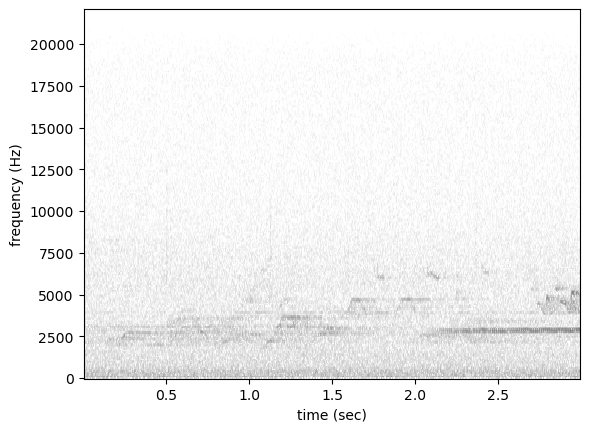

In [75]:
next_example_idx = show_example(next_example_idx)

# Check that the confusion matrix is working properly.

Here's the function which calculates the metrics. 


``` py
def single_target_metrics(targets, scores):
    """generate various metrics for a set of scores and labels (targets)

    Predicts 1 for the highest scoring class per sample and 0 for
    all other classes.

    Args:
        targets: 0/1 lables in 2d array
        scores: continuous values in 2d array

    Returns:
        metrics_dict: dictionary of various overall and per-class metrics

    """
    if max(np.sum(targets, 1)) > 1:
        raise ValueError(
            "Labels were not single target! "
            "Use multi-target classifier if multiple classes can be present "
            "in a single sample."
        )

    metrics_dict = {}

    preds = predict_single_target_labels(scores=scores)

    # Confusion matrix requires numbered-class not one-hot labels
    t = np.argmax(targets, 1)
    p = np.argmax(preds, 1)
    metrics_dict["confusion_matrix"] = M.confusion_matrix(t, p)

    # precision, recall, and f1
    pre, rec, f1, _ = M.precision_recall_fscore_support(
        targets, preds, average=None, zero_division=0
    )
    metrics_dict.update({"precision": pre[1], "recall": rec[1], "f1": f1[1]})

    try:
        metrics_dict["jaccard"] = M.jaccard_score(targets, preds, average="macro")
    except ValueError:
        metrics_dict["jaccard"] = np.nan
    try:
        metrics_dict["hamming_loss"] = M.hamming_loss(targets, preds)
    except ValueError:
        metrics_dict["hamming_loss"] = np.nan

    return metrics_dict
    ```

In [78]:
model.classes

['target_presence']

In [35]:
valid_set_with_confidence = valid_set.copy()
valid_set = valid_set.drop(columns=["confidence_cat"])

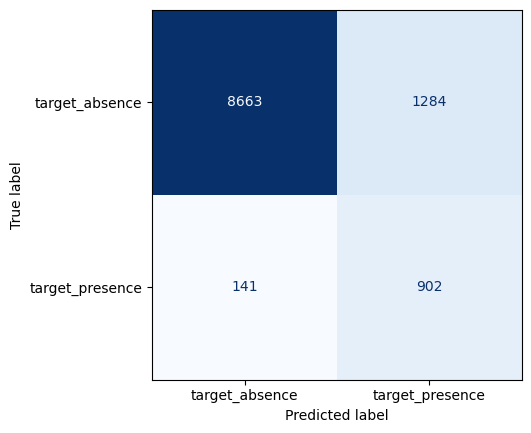

In [36]:
cm = opso.metrics.M.confusion_matrix(np.argmax(valid_set, 1), np.argmax(valid_set_preds, 1))
opso.metrics.M.ConfusionMatrixDisplay(cm, display_labels=valid_set.columns).plot(cmap='Blues', colorbar=False)

# Understanding the scikitlearn metrics 
### From the skleaern user guide 

#### 3.3. Metrics and scoring: quantifying the quality of predictions¶
##### 3.3.2.1. From binary to multiclass and multilabel

Some metrics are essentially defined for binary classification tasks (e.g. f1_score, roc_auc_score). In these cases, by default only the positive label is evaluated, assuming by default that the positive class is labelled 1 (though this may be configurable through the pos_label parameter).

In extending a binary metric to multiclass or multilabel problems, the data is treated as a collection of binary problems, one for each class. There are then a number of ways to average binary metric calculations across the set of classes, each of which may be useful in some scenario. Where available, you should select among these using the average parameter.

    "macro" simply calculates the mean of the binary metrics, giving equal weight to each class. In problems where infrequent classes are nonetheless important, macro-averaging may be a means of highlighting their performance. On the other hand, the assumption that all classes are equally important is often untrue, such that macro-averaging will over-emphasize the typically low performance on an infrequent class.

    "weighted" accounts for class imbalance by computing the average of binary metrics in which each class’s score is weighted by its presence in the true data sample.

    "micro" gives each sample-class pair an equal contribution to the overall metric (except as a result of sample-weight). Rather than summing the metric per class, this sums the dividends and divisors that make up the per-class metrics to calculate an overall quotient. Micro-averaging may be preferred in multilabel settings, including multiclass classification where a majority class is to be ignored.

    "samples" applies only to multilabel problems. It does not calculate a per-class measure, instead calculating the metric over the true and predicted classes for each sample in the evaluation data, and returning their (sample_weight-weighted) average.

    Selecting average=None will return an array with the score for each class.


In [37]:
opso.metrics.single_target_metrics(valid_set, valid_set_preds)

{'confusion_matrix': array([[8663, 1284],
        [ 141,  902]]),
 'precision': 0.4126258005489479,
 'recall': 0.8648130393096836,
 'f1': 0.5586868999690308,
 'jaccard': 0.6231833053486857,
 'hamming_loss': 0.12966333030027297}

In [38]:
# changing pos_label to 0 will give the precision for the absent class
opso.metrics.M.precision_score(np.argmax(valid_set, 1), np.argmax(valid_set_preds, 1), pos_label=1, average='binary')

0.4126258005489479

In [39]:
model.valid_metrics

{0: {'confusion_matrix': array([[121, 379],
         [ 73, 427]]),
  'precision': 0.5297766749379652,
  'recall': 0.854,
  'f1': 0.6539050535987748,
  'jaccard': 0.3484742895603643,
  'hamming_loss': 0.452},
 1: {'confusion_matrix': array([[402,  98],
         [142, 358]]),
  'precision': 0.7850877192982456,
  'recall': 0.716,
  'f1': 0.7489539748953975,
  'jaccard': 0.6124152158284625,
  'hamming_loss': 0.24},
 2: {'confusion_matrix': array([[383, 117],
         [ 96, 404]]),
  'precision': 0.7754318618042226,
  'recall': 0.808,
  'f1': 0.7913809990205681,
  'jaccard': 0.6486993245080657,
  'hamming_loss': 0.213},
 3: {'confusion_matrix': array([[451,  49],
         [142, 358]]),
  'precision': 0.8796068796068796,
  'recall': 0.716,
  'f1': 0.7894156560088202,
  'jaccard': 0.6772934647532471,
  'hamming_loss': 0.191},
 4: {'confusion_matrix': array([[442,  58],
         [115, 385]]),
  'precision': 0.8690744920993227,
  'recall': 0.77,
  'f1': 0.816542948038176,
  'jaccard': 0.7043316

The precision calculation from sklearn should be ordered like this. 

![Screenshot 2024-02-27 at 11.51.53.png](<attachment:Screenshot 2024-02-27 at 11.51.53.png>)
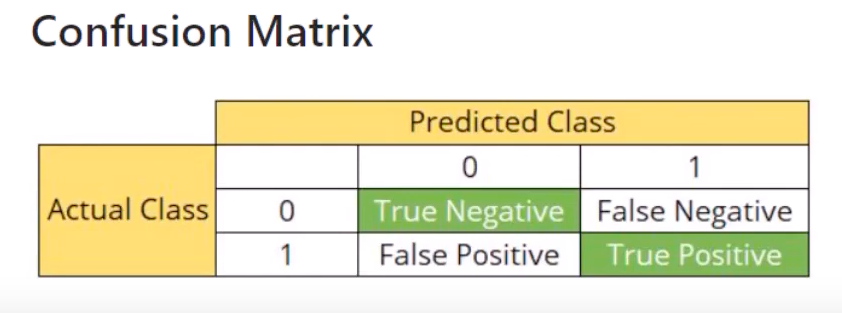

Predicted Class [0, 1] <br>
Actual Class 0 [TN, FN] <br>
Actual Class 1 [FP, TP]

# Plot top losses

In [40]:
valid_set_preds_renamed = valid_set_preds.rename(columns = {'target_presence':'present_pred', 'target_absence':'absent_pred'})
combined_full = pd.concat([valid_set_with_confidence, valid_set_preds_renamed], axis=1)

combined_full['loss'] = np.abs(combined_full['target_presence'] - combined_full['present_pred'])
top_losses = combined_full.sort_values(by='loss', ascending=False)

top_losses.head()


target_absence  \
file                                               start_time end_time                   
../../data/raw/recordings/OSFL/recording-100634... 4.5        7.5                  1.0   
../../data/raw/recordings/OSFL/recording-292293... 91.5       94.5                 1.0   
../../data/raw/recordings/OSFL/recording-294900... 1.5        4.5                  1.0   
                                                   0.0        3.0                  1.0   
../../data/raw/recordings/OSFL/recording-294236... 3.0        6.0                  1.0   

                                                                        target_presence  \
file                                               start_time end_time                    
../../data/raw/recordings/OSFL/recording-100634... 4.5        7.5                   0.0   
../../data/raw/recordings/OSFL/recording-292293... 91.5       94.5                  0.0   
../../data/raw/recordings/OSFL/recording-294900... 1.5        4.5                   0.0   
                                                   0.0        3.0                   0.0   
../../data/raw/recordings/OSFL/recording-294236... 3.0        6.0                   0.0   

                                                                        confidence_cat  \
file                                               start_time end_time                   
../../data/raw/recordings/OSFL/recording-100634... 4.5        7.5                    0   
../../data/raw/recordings/OSFL/recording-292293... 91.5       94.5                   0   
../../data/raw/recordings/OSFL/recording-294900... 1.5        4.5                    0   
                                                   0.0        3.0                    0   
../../data/raw/recordings/OSFL/recording-294236... 3.0        6.0                    0   

                                                                         absent_pred  \
file                                               start_time end_time                 
../../data/raw/recordings/OSFL/recording-100634... 4.5        7.5       5.170919e-09   
../../data/raw/recordings/OSFL/recording-292293... 91.5       94.5      4.660218e-08   
../../data/raw/recordings/OSFL/recording-294900... 1.5        4.5       4.478182e-09   
                                                   0.0        3.0       3.337361e-09   
../../data/raw/recordings/OSFL/recording-294236... 3.0        6.0       5.808935e-08   

                                                                        present_pred  \
file                                               start_time end_time                 
../../data/raw/recordings/OSFL/recording-100634... 4.5        7.5                1.0   
../../data/raw/recordings/OSFL/recording-292293... 91.5       94.5               1.0   
../../data/raw/recordings/OSFL/recording-294900... 1.5        4.5                1.0   
                                                   0.0        3.0                1.0   
../../data/raw/recordings/OSFL/recording-294236... 3.0        6.0                1.0   

                                                                        loss  
file                                               start_time end_time        
../../data/raw/recordings/OSFL/recording-100634... 4.5        7.5        1.0  
../../data/raw/recordings/OSFL/recording-292293... 91.5       94.5       1.0  
../../data/raw/recordings/OSFL/recording-294900... 1.5        4.5        1.0  
                                                   0.0        3.0        1.0  
../../data/raw/recordings/OSFL/recording-294236... 3.0        6.0        1.0

In [41]:
idx=0

In [42]:

def show_false_negatives(idx):
    df = top_losses.loc[top_losses.target_presence == 1.0]
    print(f"Predicted = {df.iloc[idx].present_pred}")
    print(f"Model Confidence = {df.iloc[idx].present_pred}")
    print(f"Actual = {df.iloc[idx].target_presence}")
    show_sample_from_df(df, idx)

def show_false_positives(idx):
    df = top_losses.loc[top_losses.target_presence == 0.0]
    print(f"Predicted = {df.iloc[idx].present_pred}")
    print(f"Model Confidence = {df.iloc[idx].present_pred}")
    print(f"Actual = {df.iloc[idx].target_presence}")
    show_sample_from_df(df, idx)

In [43]:
idx = 0

Predicted = 1.0
Model Confidence = 1.0
Actual = 0.0
../../data/raw/recordings/OSFL/recording-100634.flac 4.5 7.5


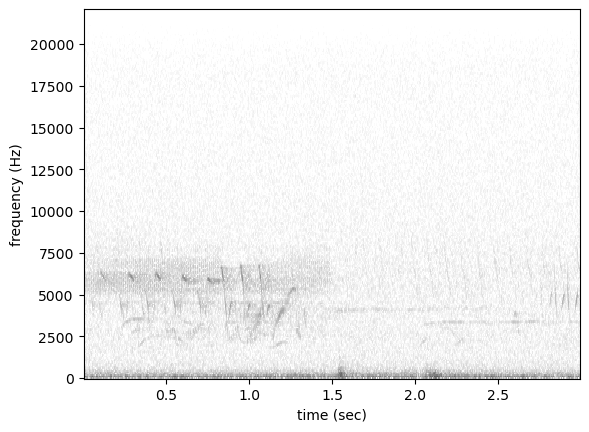

In [44]:
show_false_positives(idx)
idx+=1

Predicted = 3.2910034519773035e-07
Model Confidence = 3.2910034519773035e-07
Actual = 1.0
../../data/raw/recordings/OSFL/recording-483110.flac 97.5 100.5


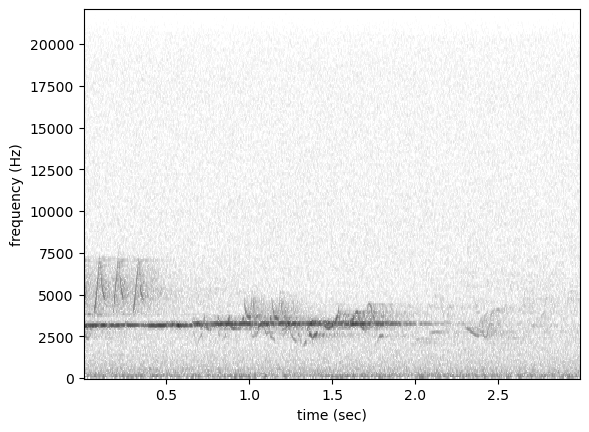

In [45]:
show_false_negatives(idx)
idx+=1